In [13]:
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use('Qt5Agg')
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action="ignore", category= FutureWarning)
import pandas_profiling

In [2]:
df=pd.read_csv('indian_liver_patient.csv')

# Exploratory Data Analysis

In [3]:
df.shape

(583, 11)

In [4]:
df.head(5)

,age,gender,tot_bilirubin,direct_bilirubin,tot_proteins,albumin,ag_ratio,sgpt,sgot,alkphos,is_patient
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1


In [5]:
df.dtypes

age                   int64
gender               object
tot_bilirubin       float64
direct_bilirubin    float64
tot_proteins          int64
albumin               int64
ag_ratio              int64
sgpt                float64
sgot                float64
alkphos             float64
is_patient            int64
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               583 non-null    int64  
 1   gender            583 non-null    object 
 2   tot_bilirubin     583 non-null    float64
 3   direct_bilirubin  583 non-null    float64
 4   tot_proteins      583 non-null    int64  
 5   albumin           583 non-null    int64  
 6   ag_ratio          583 non-null    int64  
 7   sgpt              583 non-null    float64
 8   sgot              583 non-null    float64
 9   alkphos           579 non-null    float64
 10  is_patient        583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


In [7]:
df['is_patient'].unique()

array([1, 2], dtype=int64)

In [8]:
print(df.is_patient.value_counts())

1    416
2    167
Name: is_patient, dtype: int64



## replacing values by 0&1

In [9]:
df['is_patient']=np.where((df.is_patient== int(1)),int(0), df.is_patient)
df['is_patient']= np.where((df.is_patient==int(2)),int(1),df.is_patient)

In [10]:
df.head(10)

,age,gender,tot_bilirubin,direct_bilirubin,tot_proteins,albumin,ag_ratio,sgpt,sgot,alkphos,is_patient
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,0
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,0
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,0
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,0
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,0
5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,0
6,26,Female,0.9,0.2,154,16,12,7.0,3.5,1.00,0
7,29,Female,0.9,0.3,202,14,11,6.7,3.6,1.10,0
8,17,Male,0.9,0.3,202,22,19,7.4,4.1,1.20,1
9,55,Male,0.7,0.2,290,53,58,6.8,3.4,1.00,0


In [11]:
df['is_patient'].unique()

array([0, 1], dtype=int64)

Number of Zeros (0):  416
Number of Ones (1):  167


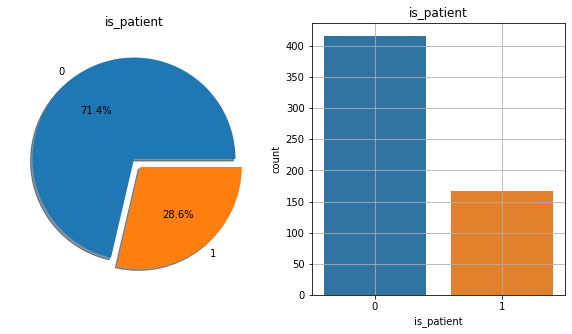

In [14]:
# visulaize the class labels of target variable(Dataset)
import seaborn as sns
import matplotlib.pyplot as plt
f,ax=plt.subplots(1,2,figsize=(10,5))
df['is_patient'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('is_patient')
ax[0].set_ylabel('')
sns.countplot('is_patient',data=df,ax=ax[1])
ax[1].set_title('is_patient')
Zeros, ones = df['is_patient'].value_counts()
print('Number of Zeros (0): ',Zeros)
print('Number of Ones (1): ',ones)
plt.grid()
plt.show()

### Droping duplicates

In [15]:
df=df.drop_duplicates()

In [16]:
df.shape

(570, 11)

### fill null values with mean

In [17]:
mean_value=df['alkphos'].mean()
print(mean_value)
df['alkphos']= df['alkphos'].fillna(mean_value)


0.9480035335689051


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 570 entries, 0 to 582
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               570 non-null    int64  
 1   gender            570 non-null    object 
 2   tot_bilirubin     570 non-null    float64
 3   direct_bilirubin  570 non-null    float64
 4   tot_proteins      570 non-null    int64  
 5   albumin           570 non-null    int64  
 6   ag_ratio          570 non-null    int64  
 7   sgpt              570 non-null    float64
 8   sgot              570 non-null    float64
 9   alkphos           570 non-null    float64
 10  is_patient        570 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 53.4+ KB


In [19]:
df.describe()

,age,tot_bilirubin,direct_bilirubin,tot_proteins,albumin,ag_ratio,sgpt,sgot,alkphos,is_patient
count,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000,570.000000
mean,44.849123,3.321754,1.497544,291.750877,79.728070,109.380702,6.496316,3.148947,0.948004,0.287719
std,16.242182,6.267941,2.833231,245.291859,181.471697,290.880671,1.088300,0.796813,0.318510,0.453097
min,4.000000,0.400000,0.100000,63.000000,10.000000,10.000000,2.700000,0.900000,0.300000,0.000000
25%,33.000000,0.800000,0.200000,176.000000,23.000000,25.000000,5.800000,2.600000,0.700000,0.000000
50%,45.000000,1.000000,0.300000,208.000000,35.000000,41.000000,6.600000,3.100000,0.948004,0.000000
75%,58.000000,2.600000,1.300000,298.000000,60.000000,86.750000,7.200000,3.800000,1.100000,1.000000
max,90.000000,75.000000,19.700000,2110.000000,2000.000000,4929.000000,9.600000,5.500000,2.800000,1.000000


### changing categorical value into numerical value

In [20]:
dummy= pd.get_dummies(df['gender'])
dummy.head()
df=pd.concat([df,dummy], axis=1)
df=df.drop('gender', axis=1)

In [21]:
df.shape



(570, 12)

In [22]:
#create independent and dependent variable
target_name='is_patient'

y=df[target_name]

x=df.drop(target_name, axis=1)

In [23]:
x.head()

,age,tot_bilirubin,direct_bilirubin,tot_proteins,albumin,ag_ratio,sgpt,sgot,alkphos,Female,Male
0,65,0.7,0.1,187,16,18,6.8,3.3,0.90,1,0
1,62,10.9,5.5,699,64,100,7.5,3.2,0.74,0,1
2,62,7.3,4.1,490,60,68,7.0,3.3,0.89,0,1
3,58,1.0,0.4,182,14,20,6.8,3.4,1.00,0,1
4,72,3.9,2.0,195,27,59,7.3,2.4,0.40,0,1


In [24]:
x.shape

(570, 11)

In [25]:
y.shape

(570,)

In [26]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: is_patient, dtype: int64

# split the dataset

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
#split into train/ test validation dataset
x_train, x_val, y_train, y_val= train_test_split(x, y, test_size=0.2, random_state=5)

In [29]:
x_train.shape, y_train.shape

((456, 11), (456,))

In [30]:
x_val.shape, y_val.shape

((114, 11), (114,))

In [31]:
x_val[1:570]

,age,tot_bilirubin,direct_bilirubin,tot_proteins,albumin,ag_ratio,sgpt,sgot,alkphos,Female,Male
175,31,0.8,0.2,198,43,31,7.3,4.0,1.2,0,1
130,45,3.2,1.4,512,50,58,6.0,2.7,0.8,0,1
374,56,0.7,0.1,145,26,23,7.0,4.0,1.3,1,0
563,64,1.4,0.5,298,31,83,7.2,2.6,0.5,0,1
352,26,0.7,0.2,144,36,33,8.2,4.3,1.1,1,0
...,...,...,...,...,...,...,...,...,...,...,...
428,52,0.6,0.1,194,10,12,6.9,3.3,0.9,1,0
529,55,3.3,1.5,214,54,152,5.1,1.8,0.5,0,1
198,41,0.9,0.2,169,22,18,6.1,3.0,0.9,0,1
3,58,1.0,0.4,182,14,20,6.8,3.4,1.0,0,1


In [32]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train= sc.fit_transform(x_train)
x_val=sc.transform(x_val)

## Fit the algorithm randomforest

In [33]:
from sklearn.ensemble import RandomForestClassifier

In [34]:
random_forest = RandomForestClassifier(n_estimators=100,max_depth=50, min_samples_leaf=20)

In [35]:
random_forest.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=50, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=20, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [36]:
random_forest.estimators_

[DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=50, max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=20, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort='deprecated',
                        random_state=1086656520, splitter='best'),
 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=50, max_features='auto', max_leaf_nodes=None,
                        min_impurity_decrease=0.0, min_impurity_split=None,
                        min_samples_leaf=20, min_samples_split=2,
                        min_weight_fraction_leaf=0.0, presort='deprecated',
                        random_state=44238644, splitter='best'),
 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                        max_depth=50, max_fe

In [37]:
len(random_forest.estimators_)

100

### feature importance plot

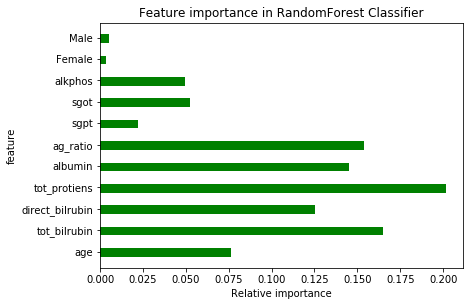

<Figure size 360x360 with 0 Axes>

In [38]:
col = ["age","tot_bilrubin","direct_bilrubin","tot_protiens","albumin","ag_ratio","sgpt","sgot","alkphos","Female","Male"]

#modelname.feature_importance_
y = random_forest.feature_importances_
#plot
fig, ax = plt.subplots() 
width = 0.4 # the width of the bars 
ind = np.arange(len(y)) # the x locations for the groups
ax.barh(ind, y, width, color='green')
ax.set_yticks(ind+width/10)
ax.set_yticklabels(col, minor=False)

plt.title("Feature importance in RandomForest Classifier")
plt.xlabel("Relative importance")
plt.ylabel("feature") 
plt.figure(figsize=(5,5))
fig.set_size_inches(6.5, 4.5, forward=True)
plt.show()

### Decision tree

[Text(530.1, 498.3, 'X[2] <= -0.31\ngini = 0.42\nsamples = 288\nvalue = [319, 137]'),
 Text(334.79999999999995, 407.70000000000005, 'X[4] <= -0.257\ngini = 0.49\nsamples = 180\nvalue = [167, 125]'),
 Text(223.2, 317.1, 'X[0] <= 1.107\ngini = 0.492\nsamples = 107\nvalue = [77, 100]'),
 Text(167.39999999999998, 226.5, 'X[3] <= -0.323\ngini = 0.465\nsamples = 84\nvalue = [51, 88]'),
 Text(111.6, 135.89999999999998, 'X[3] <= -0.483\ngini = 0.417\nsamples = 64\nvalue = [32, 76]'),
 Text(55.8, 45.299999999999955, 'gini = 0.479\nsamples = 37\nvalue = [23, 35]'),
 Text(167.39999999999998, 45.299999999999955, 'gini = 0.295\nsamples = 27\nvalue = [9, 41]'),
 Text(223.2, 135.89999999999998, 'gini = 0.475\nsamples = 20\nvalue = [19, 12]'),
 Text(279.0, 226.5, 'gini = 0.432\nsamples = 23\nvalue = [26, 12]'),
 Text(446.4, 317.1, 'X[7] <= 0.89\ngini = 0.34\nsamples = 73\nvalue = [90, 25]'),
 Text(390.59999999999997, 226.5, 'X[4] <= -0.073\ngini = 0.225\nsamples = 53\nvalue = [74, 11]'),
 Text(334.799

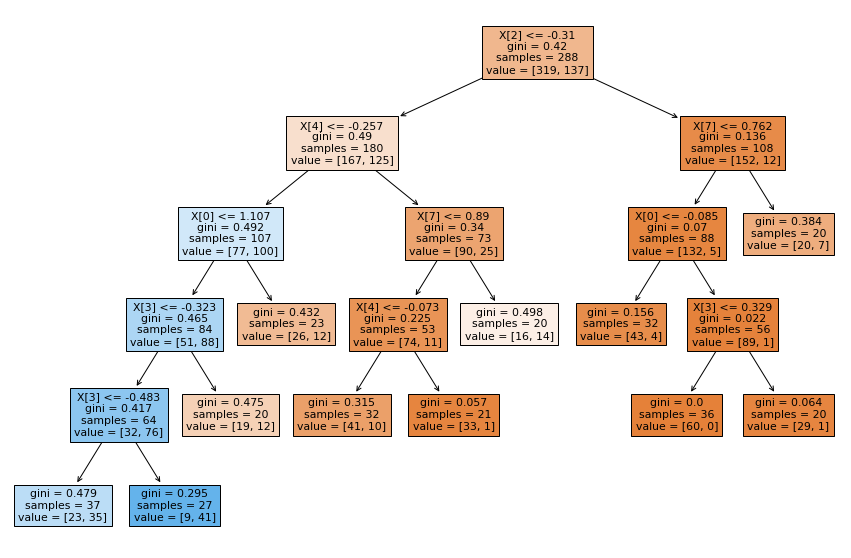

In [39]:
#for a single decision tree
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(random_forest.estimators_[5],filled=True)

In [40]:
#all deciosion tree details
for i in range(len(random_forest.estimators_)):
    print(tree.export_text(random_forest.estimators_[i]))

|--- feature_4 <= -0.09
|   |--- feature_3 <= -0.36
|   |   |--- feature_8 <= 0.57
|   |   |   |--- feature_5 <= -0.26
|   |   |   |   |--- feature_6 <= 0.00
|   |   |   |   |   |--- class: 1.0
|   |   |   |   |--- feature_6 >  0.00
|   |   |   |   |   |--- class: 0.0
|   |   |   |--- feature_5 >  -0.26
|   |   |   |   |--- feature_5 <= -0.23
|   |   |   |   |   |--- class: 0.0
|   |   |   |   |--- feature_5 >  -0.23
|   |   |   |   |   |--- class: 0.0
|   |   |--- feature_8 >  0.57
|   |   |   |--- feature_8 <= 1.13
|   |   |   |   |--- class: 1.0
|   |   |   |--- feature_8 >  1.13
|   |   |   |   |--- class: 0.0
|   |--- feature_3 >  -0.36
|   |   |--- feature_2 <= -0.27
|   |   |   |--- feature_1 <= -0.44
|   |   |   |   |--- class: 0.0
|   |   |   |--- feature_1 >  -0.44
|   |   |   |   |--- class: 0.0
|   |   |--- feature_2 >  -0.27
|   |   |   |--- class: 0.0
|--- feature_4 >  -0.09
|   |--- feature_1 <= -0.37
|   |   |--- class: 0.0
|   |--- feature_1 >  -0.37
|   |   |--- featu

In [41]:
#for printing all decion trees

import os
from sklearn.tree import export_graphviz
import six
import pydot
from sklearn import tree

In [42]:
dotfile = six.StringIO()
i_tree = 0
for tree_in_forest in random_forest.estimators_:
    export_graphviz(tree_in_forest,out_file='tree.dot',
    feature_names=["age","tot_bilrubin","direct_bilrubin","tot_protiens","albumin","ag_ratio","sgpt","sgot","alkphos","Female","Male"],
                   
    filled=True,
    rounded=True)
    (graph,) = pydot.graph_from_dot_file('tree.dot')
    name = 'tree' + str(i_tree)
    graph.write_png(name+  '.png')
    os.system('dot -Tpng tree.dot -o tree.png')
    i_tree +=1
    print("Decision Tree {} saved as png file".format(i_tree))

Decision Tree 1 saved as png file
Decision Tree 2 saved as png file
Decision Tree 3 saved as png file
Decision Tree 4 saved as png file
Decision Tree 5 saved as png file
Decision Tree 6 saved as png file
Decision Tree 7 saved as png file
Decision Tree 8 saved as png file
Decision Tree 9 saved as png file
Decision Tree 10 saved as png file
Decision Tree 11 saved as png file
Decision Tree 12 saved as png file
Decision Tree 13 saved as png file
Decision Tree 14 saved as png file
Decision Tree 15 saved as png file
Decision Tree 16 saved as png file
Decision Tree 17 saved as png file
Decision Tree 18 saved as png file
Decision Tree 19 saved as png file
Decision Tree 20 saved as png file
Decision Tree 21 saved as png file
Decision Tree 22 saved as png file
Decision Tree 23 saved as png file
Decision Tree 24 saved as png file
Decision Tree 25 saved as png file
Decision Tree 26 saved as png file
Decision Tree 27 saved as png file
Decision Tree 28 saved as png file
Decision Tree 29 saved as png

In [43]:
from glob import glob
from IPython.display import display, Image
import PIL
images = [ PIL.Image.open(f) for f in glob('./*.png') ]

In [44]:
images

[<PIL.PngImagePlugin.PngImageFile image mode=RGBA size=720x360 at 0x28D65B8CB08>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1488x636 at 0x28D66D035C8>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1583x775 at 0x28D653F6588>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1084x636 at 0x28D66D03388>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1440x636 at 0x28D66D03148>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1060x913 at 0x28D65A1B708>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1071x913 at 0x28D65A1B788>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1169x913 at 0x28D65A1BA08>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1235x775 at 0x28D65A1B748>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1095x775 at 0x28D66D03DC8>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=1276x913 at 0x28D65A1BE48>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=863x775 at 0x28D65A1B3C8>,
 <PIL.

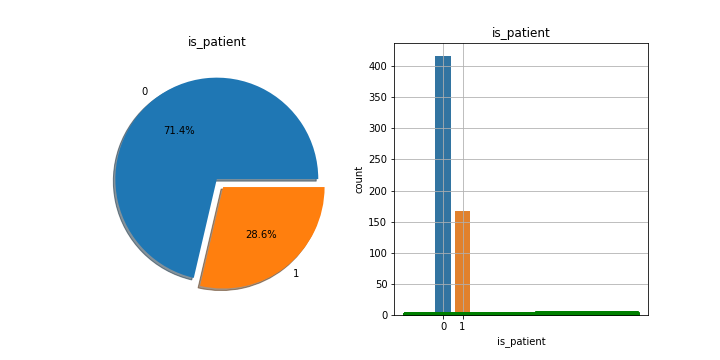

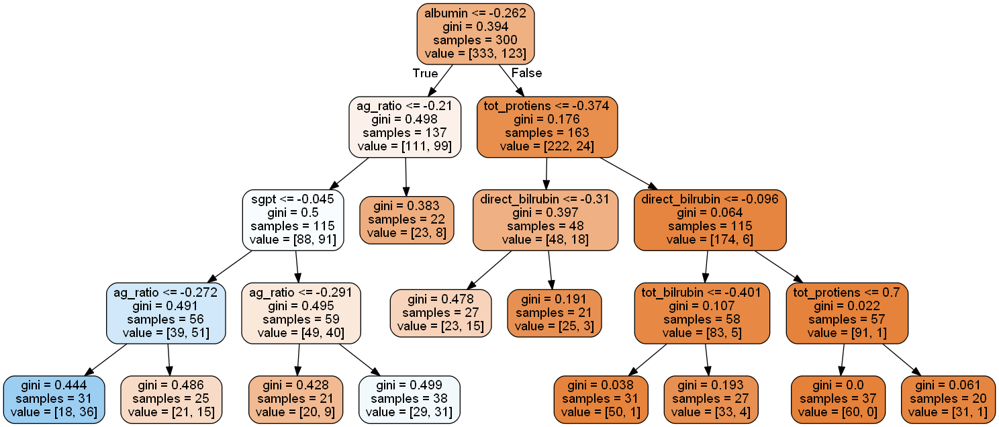

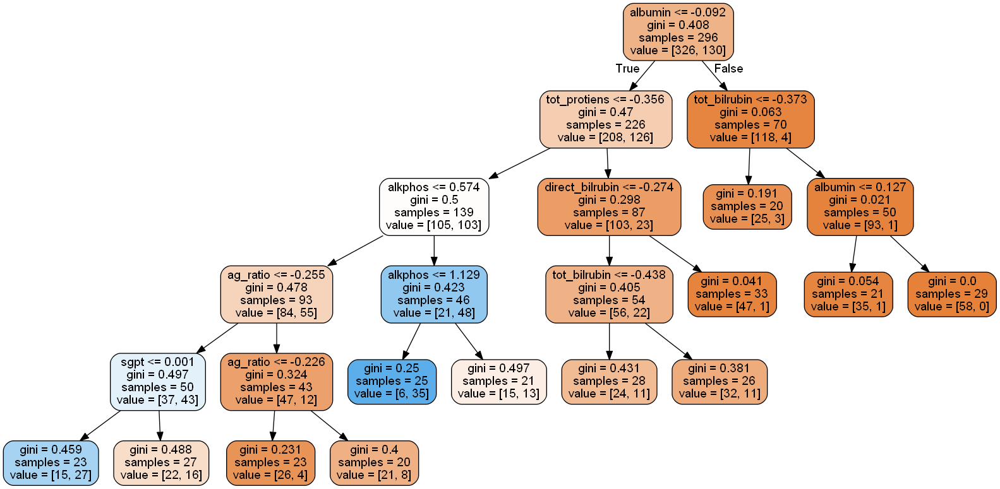

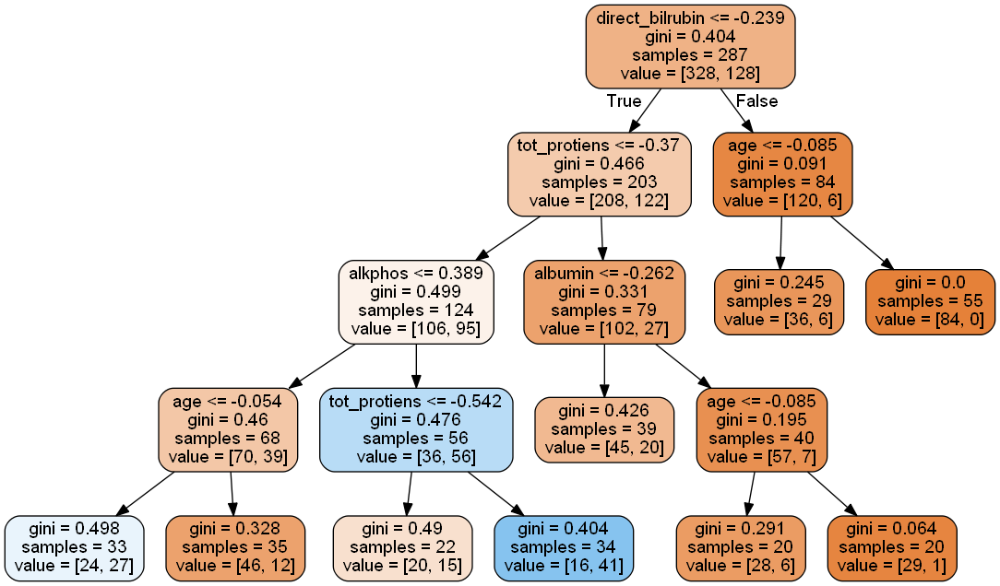

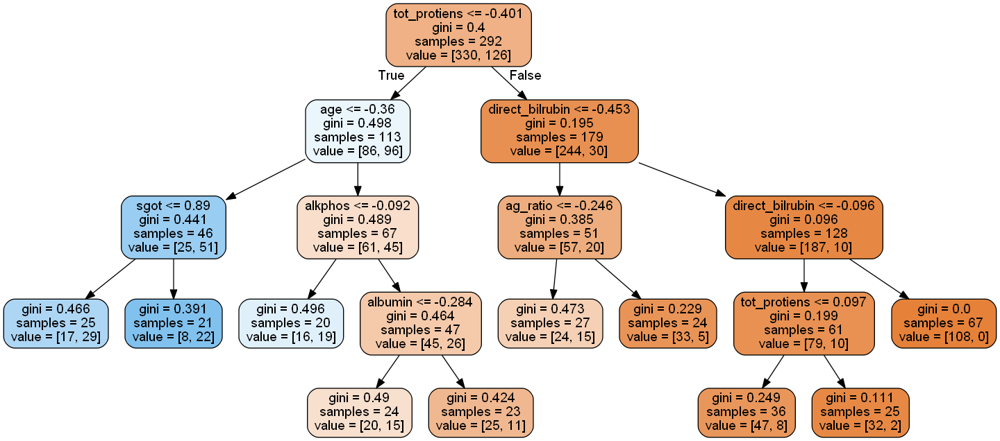

...

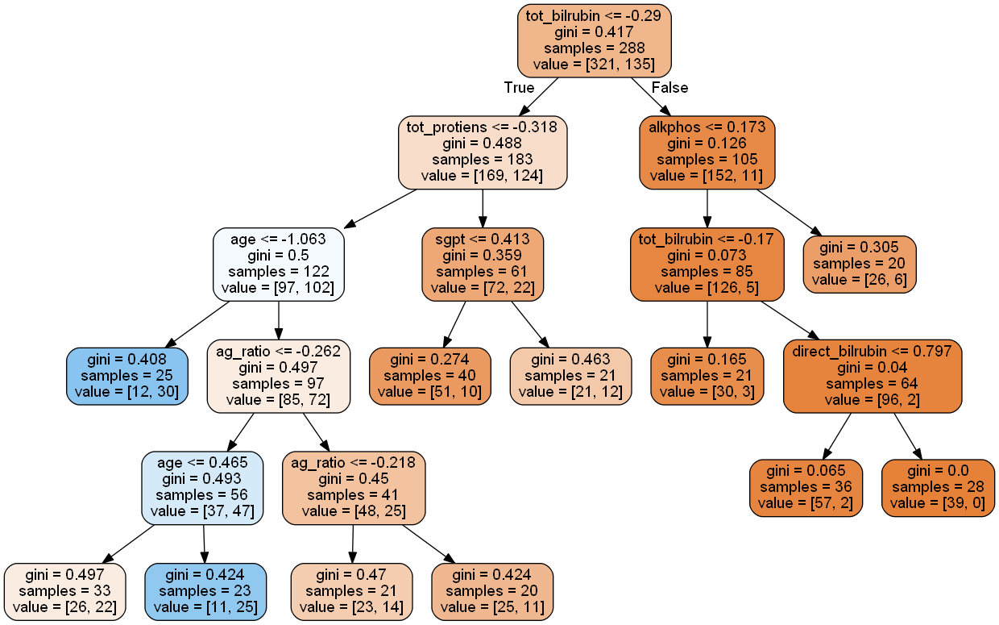

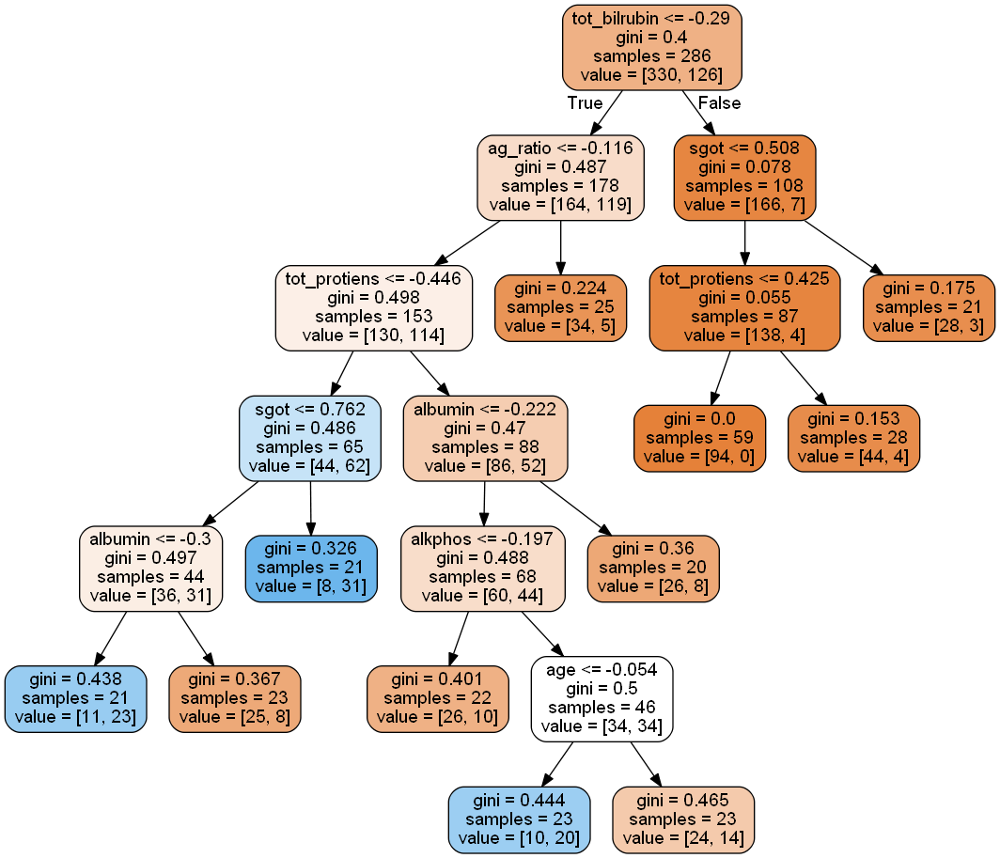

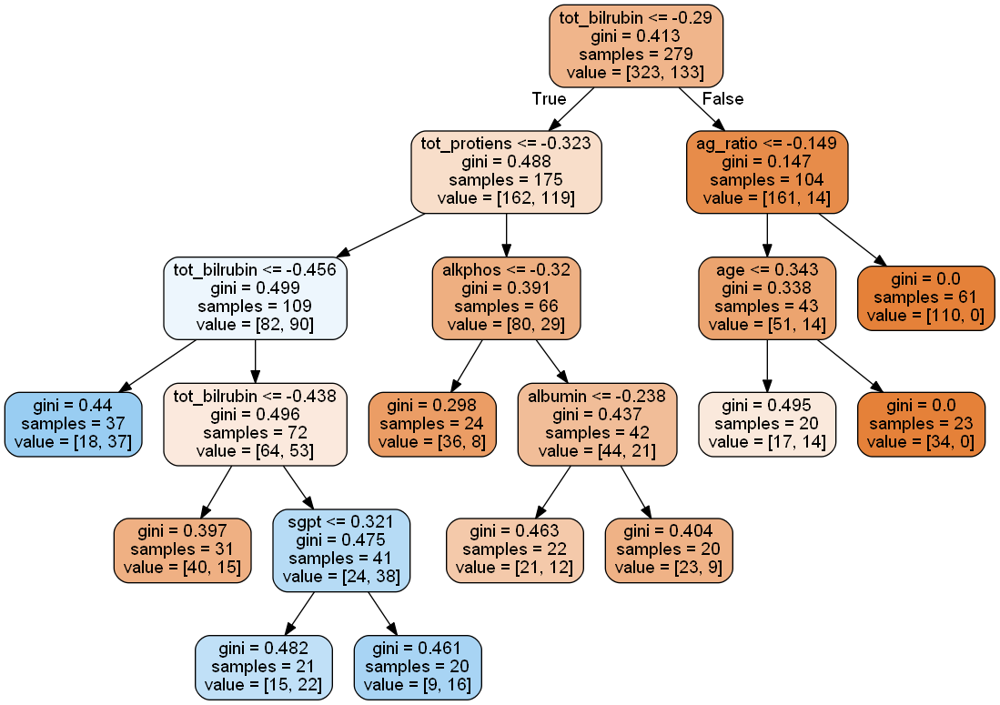

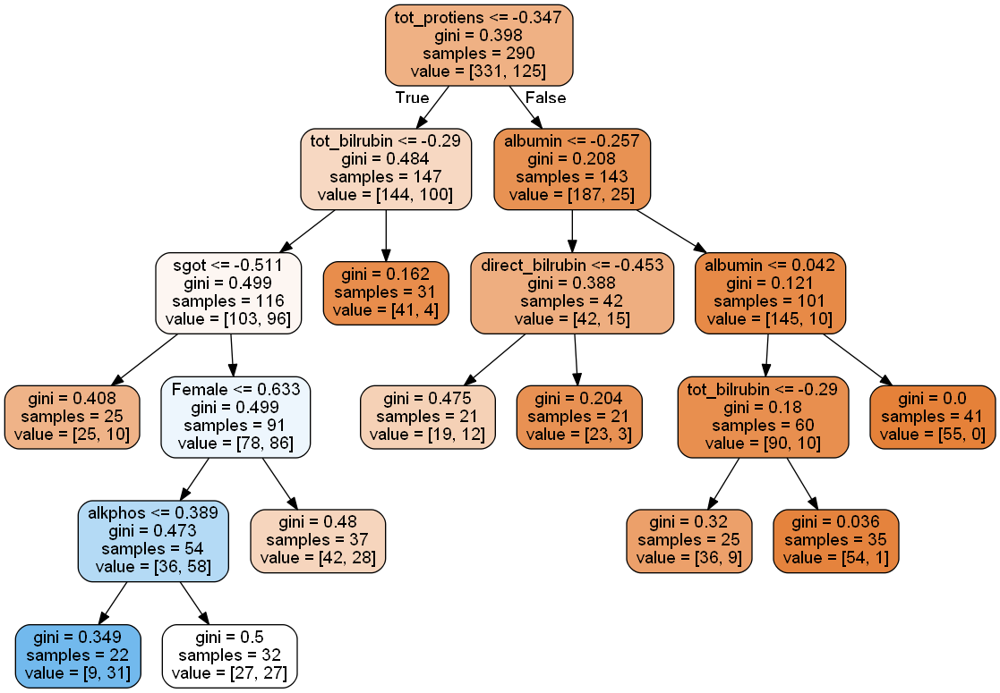

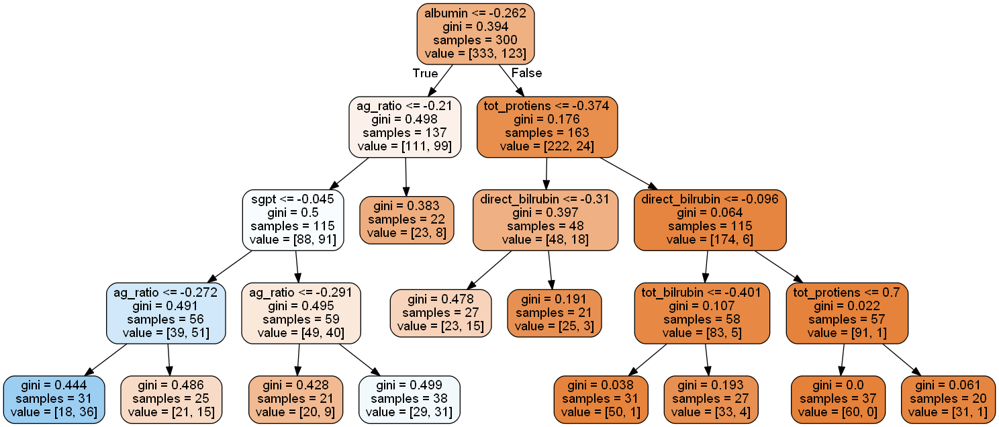

In [45]:
for im in images:
    display(Image(filename=im.filename, retina=True))

In [49]:
#Predict Output
rf_predicted = random_forest.predict(x_val)


In [58]:
rf_pred=random_forest.predict_proba(x_val)

In [50]:
random_forest_score = round(random_forest.score(x_train, y_train) * 100, 2)
print('Random Forest Score on Train data: \n', random_forest_score)

Random Forest Score on Train data: 
 77.85


In [51]:
random_forest_score_test = round(random_forest.score(x_val, y_val) * 100, 2)
print('Random Forest Score on test data: \n', random_forest_score_test)

Random Forest Score on test data: 
 68.42


In [52]:
from sklearn.metrics import accuracy_score
rf_accuracy_score=round(accuracy_score(y_val,rf_predicted)*100)
print('Accuracy: \n', rf_accuracy_score)

Accuracy: 
 68.0


### calibration plot

In [60]:
from sklearn.calibration import calibration_curve
rf_y,rf_x= calibration_curve(y_val,rf_pred[:,1],n_bins=100)

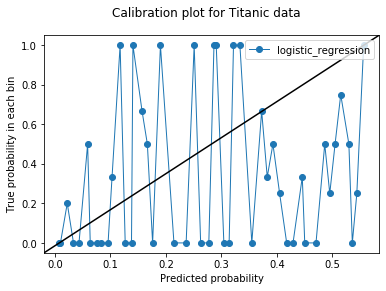

In [61]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms

fig, ax = plt.subplots()
# only these two lines are calibration curves
plt.plot(rf_x,rf_y, marker='o', linewidth=1, label='logistic_regression')


# reference line, legends, and axis labels
line = mlines.Line2D([0, 1], [0, 1], color='black')
transform = ax.transAxes
line.set_transform(transform)
ax.add_line(line)
fig.suptitle('Calibration plot for Titanic data')
ax.set_xlabel('Predicted probability')
ax.set_ylabel('True probability in each bin')
plt.legend()
plt.show()

In [40]:
from sklearn.metrics import classification_report,confusion_matrix
print(confusion_matrix(y_val,rf_predicted))

[[137  25]
 [ 46  20]]


## precision

In [41]:
from sklearn.metrics import precision_score

In [42]:
print("precision Score of macro is:", precision_score(y_val,rf_predicted, average='macro')*100)
print("precision Score of micro is:", precision_score(y_val,rf_predicted, average='micro')*100)
print("precision Score of weighted is:", precision_score(y_val,rf_predicted, average='weighted')*100)

precision Score of macro is: 59.65391621129326
precision Score of micro is: 68.85964912280701
precision Score of weighted is: 66.05790432365066


## recall

In [43]:
from sklearn.metrics import recall_score
print("recall_Score of macro is:",recall_score(y_val,rf_predicted, average='macro')*100)
print("recall_Score of micro is:",recall_score(y_val,rf_predicted, average='micro')*100)
print("recall_Score of weighted is:",recall_score(y_val,rf_predicted, average='weighted')*100)

recall_Score of macro is: 57.4354657687991
recall_Score of micro is: 68.85964912280701
recall_Score of weighted is: 68.85964912280701


## f1-score

In [44]:
from sklearn.metrics import f1_score
print('f1_score of macro :',f1_score(y_val, rf_predicted, average='macro')*100)
print('f1_score of micro :',f1_score(y_val, rf_predicted, average='micro')*100)
print('f1_score of weighted :',f1_score(y_val, rf_predicted, average='weighted')*100)

f1_score of macro : 57.72816294555425
f1_score of micro : 68.85964912280701
f1_score of weighted : 66.8616900653514


## Roc curve

In [45]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
%matplotlib inline

In [46]:
rf_y_pred_prob = random_forest.predict_proba(x_val)[:,1]
FPR,TPR, thresholds = roc_curve(y_val, rf_y_pred_prob)

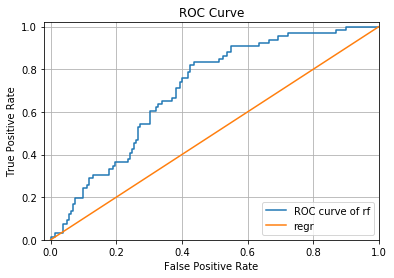

In [47]:
# create plot
plt.plot(FPR,TPR, label='ROC curve of rf')
plt.plot([0, 1], [0, 1],label='regr')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.xlim([-0.02, 1])
plt.ylim([0, 1.02])
plt.legend(loc="lower right")
plt.grid()
plt.show()